## Lane Shape Modeling
1) load the trained Instance Segmentation model
2) predict lane masks
3) fit mathematical equations (Polynomials/Splines) to the detected lanes.

In [21]:
import os
import json
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt


# Configuration
BASE_DIR = os.getcwd()
DATA_DIR = r'C:\Users\Alex\Documents\Clase\Italia\Segundo_ano\ADAS\Project\TU_Simple_folder\TUSimple'
TRAIN_SET_DIR = os.path.join(DATA_DIR, 'train_set')
PROCESSED_DATA_DIR = os.path.join(DATA_DIR, r'processed\instance')
CHECKPOINT_DIR = os.path.join(BASE_DIR, r'checkpoints\instance')
eval_filename = f'best_model_instance_e20.pth'
EVAL_MODEL_PATH = os.path.join(CHECKPOINT_DIR, eval_filename)
# Polynomial degree to fit
polynomial_degree = 2 

NUM_CLASSES = 6 
IMG_HEIGHT = 288
IMG_WIDTH = 512
EPOCHS = 5 
BATCH_SIZE = 8
LEARNING_RATE = 5*1e-4
model_filename = f'best_model_instance_e{EPOCHS}.pth'
BEST_MODEL_PATH = os.path.join(CHECKPOINT_DIR, model_filename)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


## 1. Model & Dataset Definitions
Same as lane detection

In [22]:
class TuSimpleDataset(Dataset):
    def __init__(self, root_dir, processed_dir, json_files, transform=None):
        self.root_dir = root_dir
        self.processed_dir = processed_dir
        self.transform = transform
        self.samples = []

        for json_file in json_files:
            json_path = os.path.join(root_dir, json_file)
            if not os.path.exists(json_path):
                continue
                
            with open(json_path, 'r') as f:
                lines = f.readlines()
            
            for line in lines:
                info = json.loads(line)
                raw_file = info['raw_file']
                mask_file = raw_file.replace('.jpg', '.png')
                img_path = os.path.join(self.root_dir, raw_file)
                mask_path = os.path.join(self.processed_dir, mask_file)
                self.samples.append((raw_file, mask_file))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_rel_path, mask_rel_path = self.samples[idx]
        img_path = os.path.join(self.root_dir, img_rel_path)
        mask_path = os.path.join(self.processed_dir, mask_rel_path)
        
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)

        image = image.astype(np.float32) / 255.0
        image = np.transpose(image, (2, 0, 1))
        image = torch.from_numpy(image).float()
        mask = torch.from_numpy(mask).long()
        return image, mask

In [23]:
# U-Net Architecture
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )
    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024)
        self.up1 = Up(1024, 512)
        self.up2 = Up(512, 256)
        self.up3 = Up(256, 128)
        self.up4 = Up(128, 64)
        self.outc = OutConv(64, n_classes)
    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        out = self.outc(x)
        return out

## 3. Execution & Visualization

In [24]:
def evaluate_shapes(model_path, data_dir, processed_dir, json_files, polydegree):
    # Number of random samples to visualize (this function is for qualitative inspection)
    num_visualize = 20
    dataset = TuSimpleDataset(data_dir, processed_dir, json_files)
    loader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=0)
    
    model = UNet(n_channels=3, n_classes=NUM_CLASSES).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))

    model.eval()
    
    # Colors for visualization (up to 5 lanes)
    colors = [
        (0, 0, 0),       # Background
        (0, 255, 0),     # Lane 1
        (255, 0, 0),     # Lane 2
        (0, 0, 255),     # Lane 3
        (255, 255, 0),   # Lane 4
        (255, 0, 255)    # Lane 5
    ]
    
    count = 0
    
    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Fitting Shapes"):
            if count >= num_visualize: break
            
            images = images.to(device)
            
            output = model(images)
            probs = torch.softmax(output, dim=1)
            pred_mask = torch.argmax(probs, dim=1).cpu().numpy()[0]
            
            # Convert image tensor back to uint8 image for OpenCV drawing
            img_np = images[0].cpu().permute(1, 2, 0).numpy()
            img_np = (img_np * 255).astype(np.uint8)
            img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
            
            viz_img = img_np.copy()
            
            # Fitting logic
            height, width = pred_mask.shape
            plot_y = np.linspace(0, height-1, height)
            
             # Fit a curve independently for each lane class (1..5)
            for cls_idx in range(1, NUM_CLASSES):
                # Binary mask for current lane class
                lane_mask = (pred_mask == cls_idx).astype(np.uint8)
                
                # Blob filtering
                # Keep only the largest blob if it is "lane-like" (large enough and tall enough)
                lane_mask_uint8 = lane_mask.astype(np.uint8)
                num_labels, labels_im, stats, centroids = cv2.connectedComponentsWithStats(lane_mask_uint8, connectivity=8)
                valid_lane = False
                if num_labels > 1:

                    # Find component with maximum area 
                    largest_idx = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
                    max_area = stats[largest_idx, cv2.CC_STAT_AREA]
                    max_height = stats[largest_idx, cv2.CC_STAT_HEIGHT]
                    
                    # Thresholds to reject small or short components
                    if max_area >= 1000 and max_height >= 50:
                        lane_mask = (labels_im == largest_idx).astype(np.uint8)
                        valid_lane = True
                
                if valid_lane:
                    # Extract lane pixels as x, y coordinates
                    y_coords, x_coords = np.where(lane_mask == 1)
                    
                    # Fit Polynomial
                    lane_fit = np.polyfit(y_coords, x_coords, polydegree) 
                    print(f'Lane {cls_idx} Equation: x = {lane_fit[0]:.6f}*y^2 + {lane_fit[1]:.6f}*y + {lane_fit[2]:.6f}')
                    
                    # Plot only where lane pixels exist
                    plot_y_min = np.min(y_coords)
                    plot_y_max = np.max(y_coords)
                    plot_y_constrained = np.linspace(plot_y_min, plot_y_max, int(plot_y_max - plot_y_min + 1))
                    
                    lane_fitx = np.polyval(lane_fit, plot_y_constrained)
                    
                    # Draw Points
                    pts = np.array([np.transpose(np.vstack([lane_fitx, plot_y_constrained]))])
                    pts = pts.astype(np.int32)
                    
                    color_rgb = colors[cls_idx if cls_idx < len(colors) else 1]
                    color_bgr = (color_rgb[2], color_rgb[1], color_rgb[0])
                    
                    cv2.polylines(viz_img, pts, isClosed=False, color=color_bgr, thickness=2) # THICKNESS 2
    
            # Plot
            fig, ax = plt.subplots(1, 2, figsize=(20, 8))
            
            # Ground Truth Overlay
            gt_viz = img_np.copy()
            gt_mask_val = masks[0].cpu().numpy()
            
            for cls_idx in range(1, NUM_CLASSES):
                # Valid lane pixels for this class
                lane_bool = (gt_mask_val == cls_idx)
                
                if np.any(lane_bool):
                    color_rgb = colors[cls_idx if cls_idx < len(colors) else 1]
                    # Simple overlay: colorize pixels
                    # Note: gt_viz is BGR (from img_np)
                    gt_viz[lane_bool] = (color_rgb[2], color_rgb[1], color_rgb[0])

            ax[0].set_title("Ground Truth (Projected)")
            ax[0].imshow(cv2.cvtColor(gt_viz, cv2.COLOR_BGR2RGB))
            ax[0].axis('off')

            # Prediction + Polynomials
            ax[1].set_title("Lane Shape Modeling (Polynomial Fit)")
            ax[1].imshow(cv2.cvtColor(viz_img, cv2.COLOR_BGR2RGB))
            ax[1].axis('off')
            
            plt.show()
            
            count += 1


Fitting Shapes:   0%|          | 0/3626 [00:00<?, ?it/s]

Lane 1 Equation: x = 0.002040*y^2 + -1.769086*y + 442.928255
Lane 2 Equation: x = 0.002148*y^2 + 0.406943*y + 240.217271
Lane 3 Equation: x = 0.000709*y^2 + 2.958010*y + 18.623035


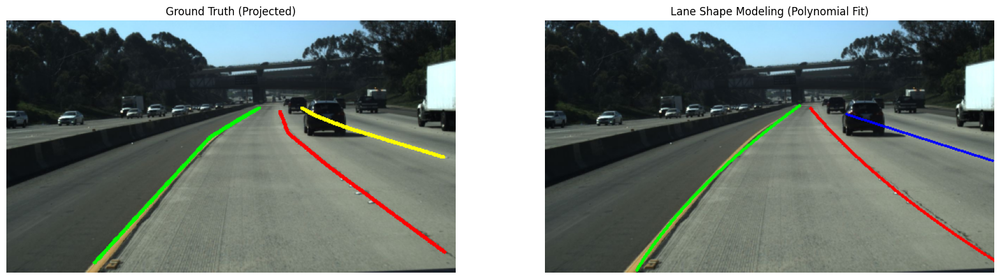

Fitting Shapes:   0%|          | 1/3626 [00:00<22:42,  2.66it/s]

Lane 1 Equation: x = 0.002329*y^2 + -3.928936*y + 628.536945
Lane 2 Equation: x = 0.000020*y^2 + -0.975995*y + 359.991109
Lane 3 Equation: x = -0.000317*y^2 + 1.389844*y + 134.194042


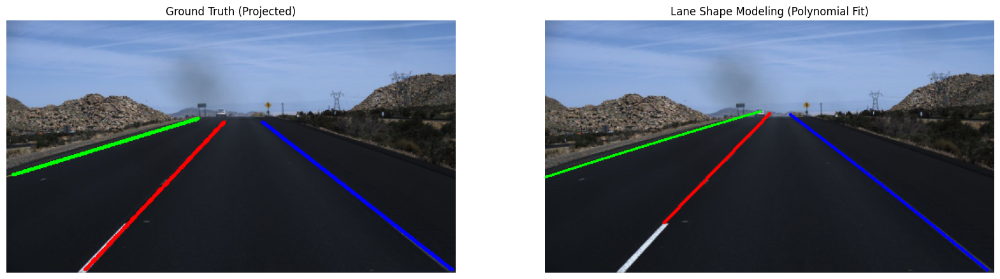

Fitting Shapes:   0%|          | 2/3626 [00:01<34:46,  1.74it/s]

Lane 1 Equation: x = -0.001007*y^2 + -0.086937*y + 247.984812
Lane 2 Equation: x = -0.002002*y^2 + 2.495574*y + 13.184635
Lane 3 Equation: x = -0.012112*y^2 + 7.462192*y + -381.698947


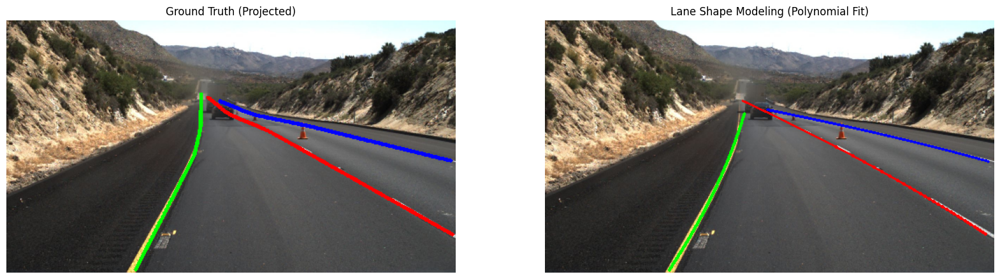

Fitting Shapes:   0%|          | 3/3626 [00:01<25:19,  2.38it/s]

Lane 1 Equation: x = -0.001688*y^2 + -0.127827*y + 231.698028
Lane 2 Equation: x = -0.001822*y^2 + 2.127539*y + 15.619627
Lane 3 Equation: x = -0.003337*y^2 + -1.649062*y + 387.715154
Lane 4 Equation: x = -0.007380*y^2 + 6.054511*y + -312.569690


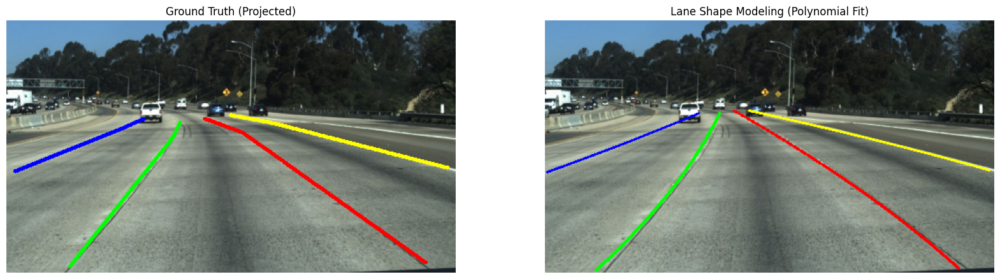

Fitting Shapes:   0%|          | 4/3626 [00:01<21:56,  2.75it/s]

Lane 1 Equation: x = 0.000134*y^2 + -0.976969*y + 356.008008
Lane 2 Equation: x = -0.000016*y^2 + 1.291815*y + 137.622614
Lane 3 Equation: x = -0.001068*y^2 + 3.434912*y + -61.044431


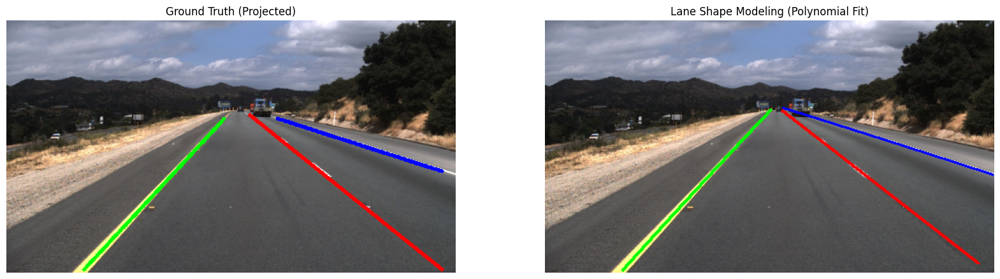

Fitting Shapes:   0%|          | 5/3626 [00:01<19:21,  3.12it/s]

Lane 1 Equation: x = -0.000058*y^2 + -1.117766*y + 372.528140
Lane 2 Equation: x = 0.000168*y^2 + 0.996447*y + 165.996059
Lane 3 Equation: x = 0.000538*y^2 + -3.294814*y + 576.261253
Lane 4 Equation: x = -0.004001*y^2 + 4.521296*y + -145.215628


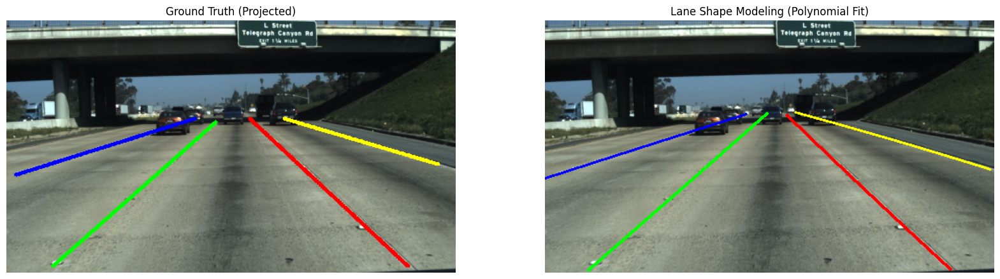

Fitting Shapes:   0%|          | 6/3626 [00:02<18:05,  3.34it/s]

Lane 2 Equation: x = 0.002130*y^2 + -4.016799*y + 633.045711
Lane 3 Equation: x = 0.000380*y^2 + -1.301250*y + 391.145864
Lane 4 Equation: x = 0.000653*y^2 + 0.791176*y + 193.580713
Lane 5 Equation: x = 0.002248*y^2 + 2.289934*y + 47.867584


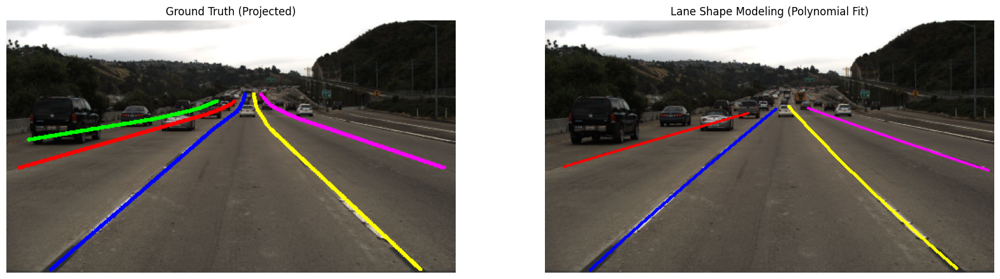

Fitting Shapes:   0%|          | 7/3626 [00:02<17:33,  3.43it/s]

Lane 1 Equation: x = 0.000797*y^2 + -1.583380*y + 410.983275
Lane 2 Equation: x = 0.000297*y^2 + 0.851234*y + 172.766796
Lane 3 Equation: x = 0.001526*y^2 + -3.949965*y + 639.211955
Lane 4 Equation: x = -0.001406*y^2 + 3.740107*y + -99.092052


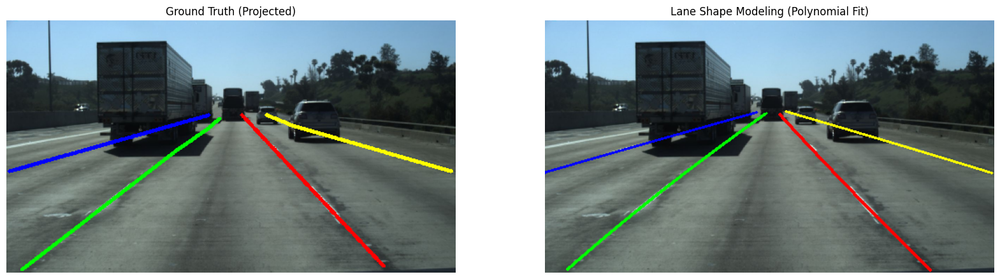

Fitting Shapes:   0%|          | 8/3626 [00:02<16:57,  3.56it/s]

Lane 1 Equation: x = -0.001081*y^2 + -0.442256*y + 285.537847
Lane 2 Equation: x = -0.000868*y^2 + 1.717920*y + 75.965510
Lane 3 Equation: x = 0.012603*y^2 + -6.148870*y + 716.749465
Lane 4 Equation: x = -0.005480*y^2 + 6.049808*y + -323.155672


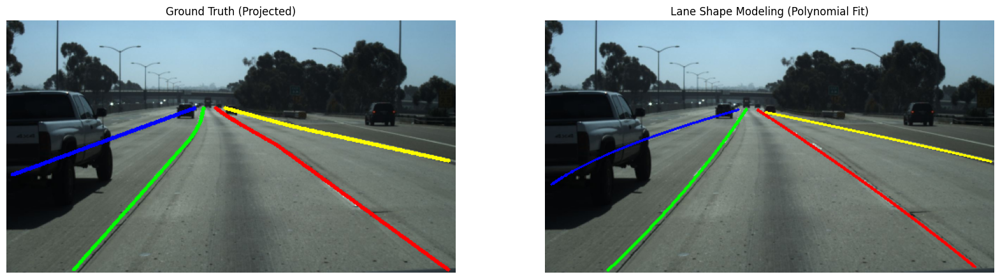

Fitting Shapes:   0%|          | 9/3626 [00:02<16:19,  3.69it/s]

Lane 1 Equation: x = -0.000018*y^2 + -0.907928*y + 341.148516
Lane 2 Equation: x = -0.000187*y^2 + 1.162234*y + 144.633421
Lane 3 Equation: x = 0.001288*y^2 + -3.351711*y + 566.031848
Lane 4 Equation: x = -0.006372*y^2 + 4.957396*y + -168.381426


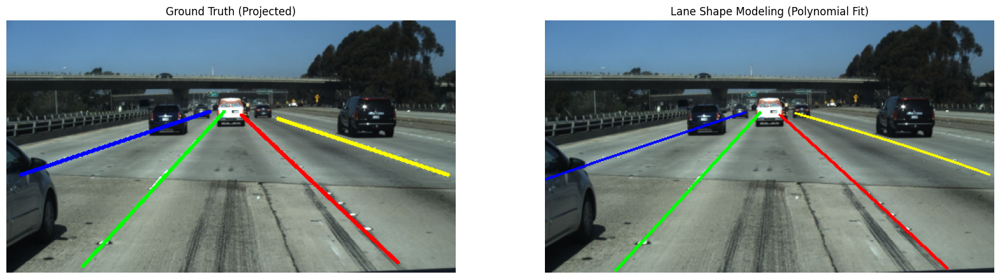

Fitting Shapes:   0%|          | 10/3626 [00:03<16:07,  3.74it/s]

Lane 1 Equation: x = -0.001448*y^2 + 0.064905*y + 197.325837
Lane 2 Equation: x = -0.002268*y^2 + 2.697240*y + -51.401181
Lane 3 Equation: x = -0.012308*y^2 + 1.401093*y + 138.684325
Lane 4 Equation: x = -0.005639*y^2 + 6.782499*y + -439.480413


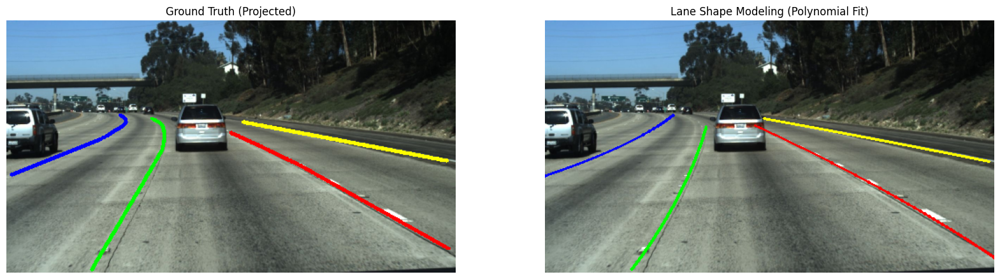

Fitting Shapes:   0%|          | 11/3626 [00:03<16:15,  3.71it/s]

Lane 1 Equation: x = 0.000072*y^2 + -0.863999*y + 345.254774
Lane 2 Equation: x = -0.000213*y^2 + 1.461266*y + 120.761004
Lane 3 Equation: x = -0.001846*y^2 + 4.039441*y + -113.655540


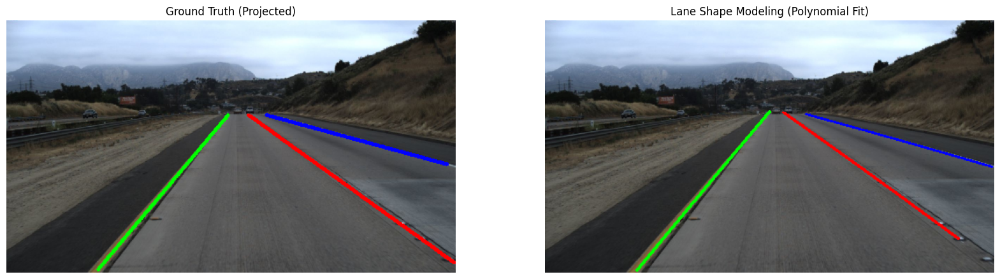

Fitting Shapes:   0%|          | 12/3626 [00:03<16:00,  3.76it/s]

Lane 1 Equation: x = -0.000457*y^2 + -0.630174*y + 294.540454
Lane 2 Equation: x = 0.001131*y^2 + 2.468794*y + -39.412417
Lane 3 Equation: x = 0.000266*y^2 + -2.848268*y + 504.515296


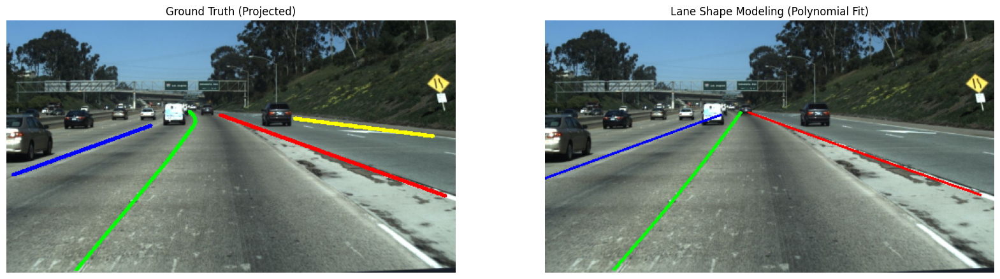

Fitting Shapes:   0%|          | 13/3626 [00:03<16:09,  3.73it/s]

Lane 1 Equation: x = -0.000064*y^2 + -0.979357*y + 353.859935
Lane 2 Equation: x = -0.000177*y^2 + 1.278686*y + 132.549968
Lane 3 Equation: x = 0.000958*y^2 + -3.316633*y + 572.807146
Lane 4 Equation: x = -0.001263*y^2 + 3.946824*y + -123.627998


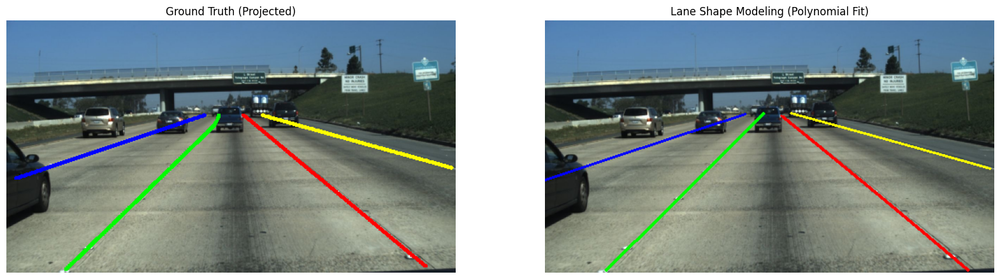

Fitting Shapes:   0%|          | 14/3626 [00:04<16:26,  3.66it/s]

Lane 1 Equation: x = -0.000109*y^2 + -1.000876*y + 356.189565
Lane 2 Equation: x = 0.000037*y^2 + 1.273682*y + 145.743562
Lane 3 Equation: x = -0.000921*y^2 + -2.727030*y + 521.282527
Lane 4 Equation: x = 0.001393*y^2 + 2.888679*y + -4.865259


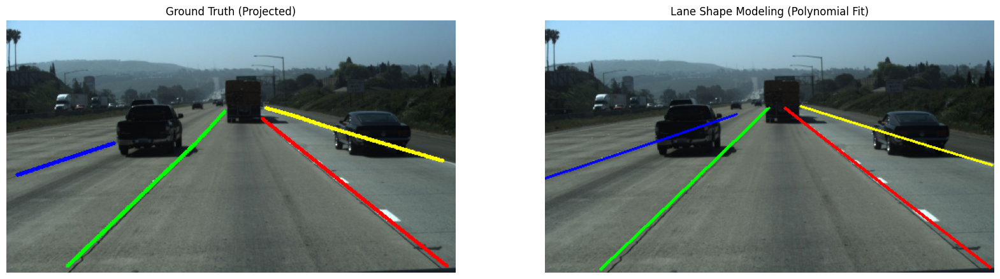

Fitting Shapes:   0%|          | 15/3626 [00:04<16:38,  3.61it/s]

Lane 2 Equation: x = 0.003697*y^2 + -4.521077*y + 679.854967
Lane 3 Equation: x = -0.000235*y^2 + -1.204141*y + 390.481838
Lane 4 Equation: x = -0.000138*y^2 + 0.992317*y + 172.959936
Lane 5 Equation: x = 0.003807*y^2 + 1.890669*y + 47.320626


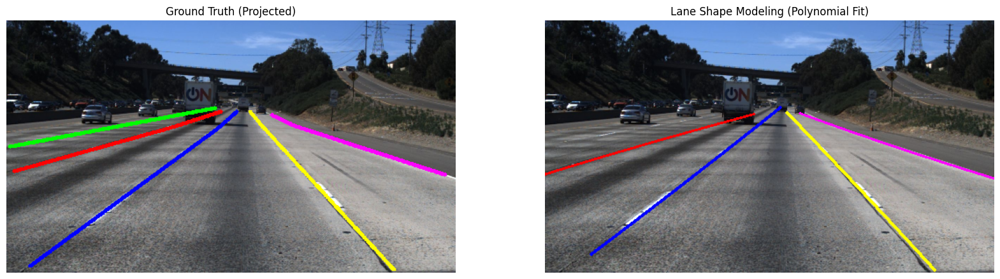

Fitting Shapes:   0%|          | 16/3626 [00:04<16:32,  3.64it/s]

Lane 1 Equation: x = -0.000161*y^2 + -1.021041*y + 364.324774
Lane 2 Equation: x = -0.000272*y^2 + 1.246705*y + 141.213911
Lane 3 Equation: x = 0.002409*y^2 + -3.906427*y + 633.513611
Lane 4 Equation: x = -0.002393*y^2 + 4.173578*y + -129.014057


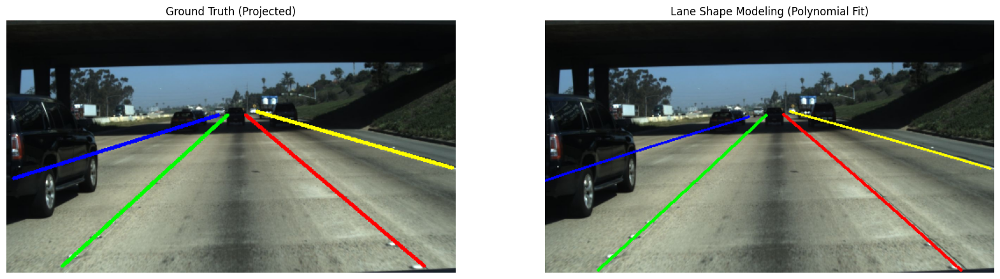

Fitting Shapes:   0%|          | 17/3626 [00:05<16:58,  3.54it/s]

Lane 1 Equation: x = -0.000532*y^2 + -0.837904*y + 333.712511
Lane 2 Equation: x = 0.000183*y^2 + 0.954465*y + 157.246498
Lane 3 Equation: x = 0.001741*y^2 + -3.311055*y + 549.495778
Lane 4 Equation: x = 0.006256*y^2 + 1.561482*y + 52.867257


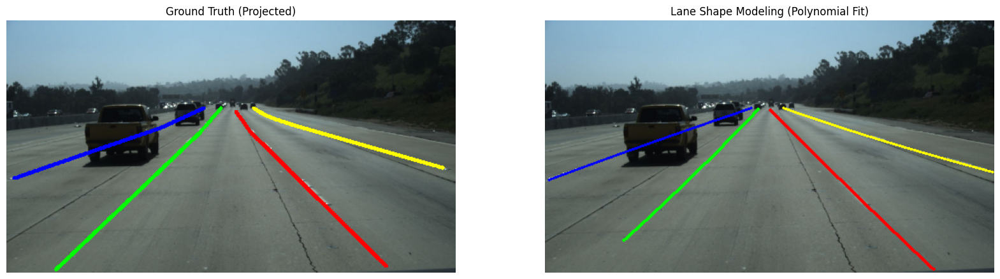

Fitting Shapes:   0%|          | 18/3626 [00:05<16:46,  3.58it/s]

Lane 1 Equation: x = 0.000195*y^2 + -1.182513*y + 366.048823
Lane 2 Equation: x = -0.000230*y^2 + 1.213488*y + 139.763161
Lane 3 Equation: x = 0.003337*y^2 + -4.154356*y + 629.569026
Lane 4 Equation: x = -0.004663*y^2 + 4.759398*y + -162.662844


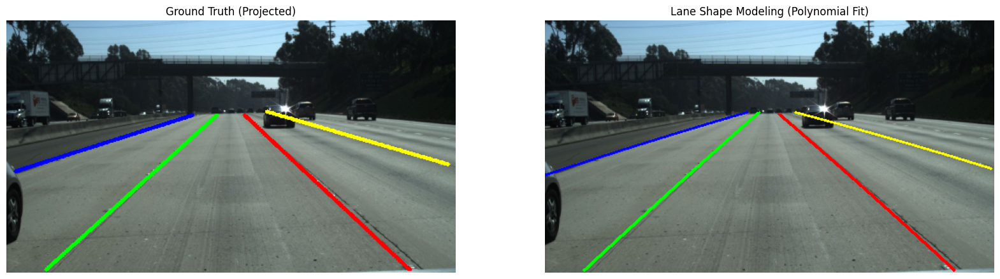

Fitting Shapes:   1%|          | 19/3626 [00:05<16:49,  3.57it/s]

Lane 1 Equation: x = -0.000187*y^2 + -0.691893*y + 321.828532
Lane 2 Equation: x = -0.000426*y^2 + 1.554208*y + 114.878895
Lane 3 Equation: x = 0.000568*y^2 + -3.035128*y + 539.686138
Lane 4 Equation: x = -0.008349*y^2 + 6.264244*y + -275.825136


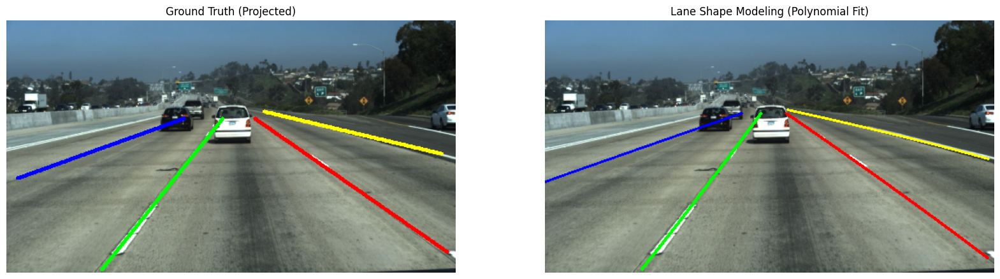

Fitting Shapes:   1%|          | 20/3626 [00:05<17:58,  3.34it/s]


In [25]:

# Run
json_files = ['label_data_0313.json', 'label_data_0531.json', 'label_data_0601.json']
evaluate_shapes(EVAL_MODEL_PATH, TRAIN_SET_DIR, PROCESSED_DATA_DIR, json_files, polynomial_degree)